In [2]:
%pylab inline
%matplotlib inline

from scipy import ndimage


Populating the interactive namespace from numpy and matplotlib


In [3]:
def combine_channels(ch1, ch2, ch3):
    return np.array([ch1.T, ch2.T, ch3.T]).T
    
def gamma_decode(img, gamma=2.2):
    return np.power(img, gamma) 

def gamma_encode(img, gamma=2.2):
    return np.power(img, 1.0/gamma)

def white_balance_gray(img):
    img_mean = 1.0/img.reshape((-1,3)).T.mean(axis=1)
    img_mean = img_mean/img_mean.max()
    return img*img_mean

In [4]:
import matplotlib.pyplot as plt
import numpy as np

def show_image(imglist, c='gray', vmin=0, vmax=1, zoom=1, needs_encoding=False):
    if type(imglist) is not list:
       imglist = [imglist]
    n = len(imglist)
    first_img = imglist[0]
    dpi = 77 # pyplot default?
    plt.figure(figsize=(first_img.shape[0]*zoom*n/dpi,first_img.shape[0]*zoom*n/dpi))
    for i in range(0,n):
        img = imglist[i]
        if needs_encoding:
            img = gamma_encode(img)
        plt.subplot(1,n,i + 1)
        plt.tight_layout()    
        plt.axis('off')
        if len(img.shape) == 2:
           img = np.repeat(img[:,:,np.newaxis],3,2)
        plt.imshow(img, interpolation='nearest')

In [60]:
def decode_pattern(pattern):
    pattern = np.array(pattern)
    r = (pattern == 'r').astype(int)
    g = (pattern == 'g').astype(int)
    b = (pattern == 'b').astype(int)
    return [r,g,b]

def make_checkerboard(size = (2,2), pattern = [[1, 0], [0 ,1]], offset=(0,0)):
    h,w = size
    yoff,xoff = offset
    pattern = np.array(pattern)
    return np.tile(pattern, (math.ceil(h+yoff/2),math.ceil(w+xoff/2)))[yoff:h+yoff,xoff:w+xoff]
    
patterns_bayer = decode_pattern([['r', 'g'],['g', 'b']])
print(patterns_bayer)

[array([[1, 0],
       [0, 0]]), array([[0, 1],
       [1, 0]]), array([[0, 0],
       [0, 1]])]


In [81]:
def demosaic_basic(img, mode='normal', patterns=patterns_bayer, offset=(0,0)):
    if mode == 'none':
        return img
    red_mask   = make_checkerboard(img.shape, patterns[0], offset)
    green_mask = make_checkerboard(img.shape, patterns[1], offset)
    blue_mask  = make_checkerboard(img.shape, patterns[2], offset)
    select_red   = red_mask * img
    select_green = green_mask * img
    select_blue  = blue_mask * img
    if mode == 'select':
        return select_red
    if mode == 'mix':
        return combine_channels(select_red, select_green, select_blue)
    kernel = np.array([[1,1,1],[1,1,1],[1,1,1]])
    count_green = ndimage.convolve(green_mask, kernel)
    count_blue  = ndimage.convolve(blue_mask , kernel)            
    count_red   = ndimage.convolve(red_mask  , kernel)
    img_linear_green = ndimage.convolve(select_green, kernel)/count_green
    img_linear_blue  = ndimage.convolve(select_blue , kernel)/count_blue
    img_linear_red   = ndimage.convolve(select_red  , kernel)/count_red
    img_linear = combine_channels(img_linear_red, img_linear_green, img_linear_blue)
    if mode == 'normal':
        return img_linear
    
def demosaic_green_edge_based(img, patterns=patterns_bayer, offset=(0,0)):
    green_mask = make_checkerboard(img.shape, patterns[1], offset)
    select_green = green_mask * img
    green_up   = np.pad(select_green, ((0,1),(0,0)), mode='constant')[1:,:]
    green_down = np.pad(select_green, ((1,0),(0,0)), mode='constant')[:-1,:]
    green_left = np.pad(select_green, ((0,0),(0,1)), mode='constant')[:,1:]
    green_right= np.pad(select_green, ((0,0),(1,0)), mode='constant')[:,:-1]
    dv = np.abs(green_up   - green_down )
    dh = np.abs(green_left - green_right)
    choose_v = dv < dh
    choose_h = dv > dh
    choose_a = (choose_v == False) & (choose_h == False) & (green_mask == 0)
    avg_v = (green_up + green_down)/2
    avg_h = (green_left + green_right)/2
    avg_a = (green_up + green_down + green_left + green_right)/4
    res = select_green   + \
        avg_h * choose_h + \
        avg_v * choose_v + \
        avg_a * choose_a
    return res

def demosaic_green_based(img, patterns=patterns_bayer, offset=(0,0)):
    g = demosaic_green_edge_based(img)
    red_mask   = make_checkerboard(img.shape, patterns[0], offset)
    blue_mask  = make_checkerboard(img.shape, patterns[2], offset)
    rg = red_mask * (img - g)
    bg = blue_mask * (img - g)
    kernel = np.array([[1,1,1],[1,1,1],[1,1,1]])            
    count_red  = ndimage.convolve(red_mask , kernel)
    count_blue = ndimage.convolve(blue_mask, kernel)
    rg_linear = ndimage.convolve(rg, kernel)/count_red
    bg_linear = ndimage.convolve(bg, kernel)/count_blue
    r = rg_linear + g
    b = bg_linear + g
    trimmed = np.maximum(np.minimum(1.0,combine_channels(r,g,b)), 0.0)
    #trimmed = combine_channels(r,g,b)
    return trimmed
    

In [36]:
def rgb2YCbCr(img):
    Y = np.dot(img, np.array([0.2989, 0.5866, 0.1145]))
    Cr = np.dot(img, np.array([-0.1687, -0.3313, 0.5000]))
    Cb = np.dot(img, np.array([0.5000,-0.4184, -0.0816]))
    return combine_channels(Y,Cr,Cb)
def YCbCr2rgb(img):
    r = np.dot(img, np.array([1.0, 0.0000, 1.4022]))
    g = np.dot(img, np.array([1.0, -0.3456, -0.7145]))
    b = np.dot(img, np.array([1.0, 1.7710, 0.0000]))
    return np.maximum(np.minimum(1.0,combine_channels(r,g,b)), 0.0)

def median_chrominance(img):
    Y = img[:,:,0]
    Cr = img[:,:,1]
    Cr = ndimage.median_filter(Cr, size=10)
    Cb = img[:,:,2]
    Cb = ndimage.median_filter(Cb, size=10)
    return combine_channels(Y,Cr,Cb)

def filter_median_chrominance(img):
    img = rgb2YCbCr(img)
    img = median_chrominance(img)
    img = YCbCr2rgb(img)
    return img

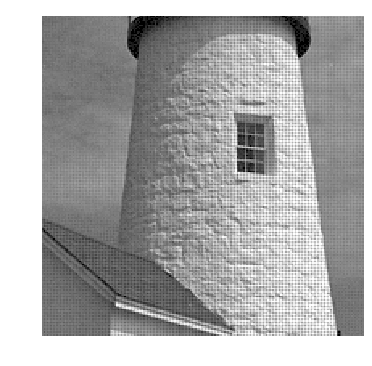

In [37]:
lh = ndimage.imread('task/data/lighthouse_RAW_noisy_sigma0.01.png')/255
show_image(lh[200:400,200:400], zoom=1.5, needs_encoding=True)

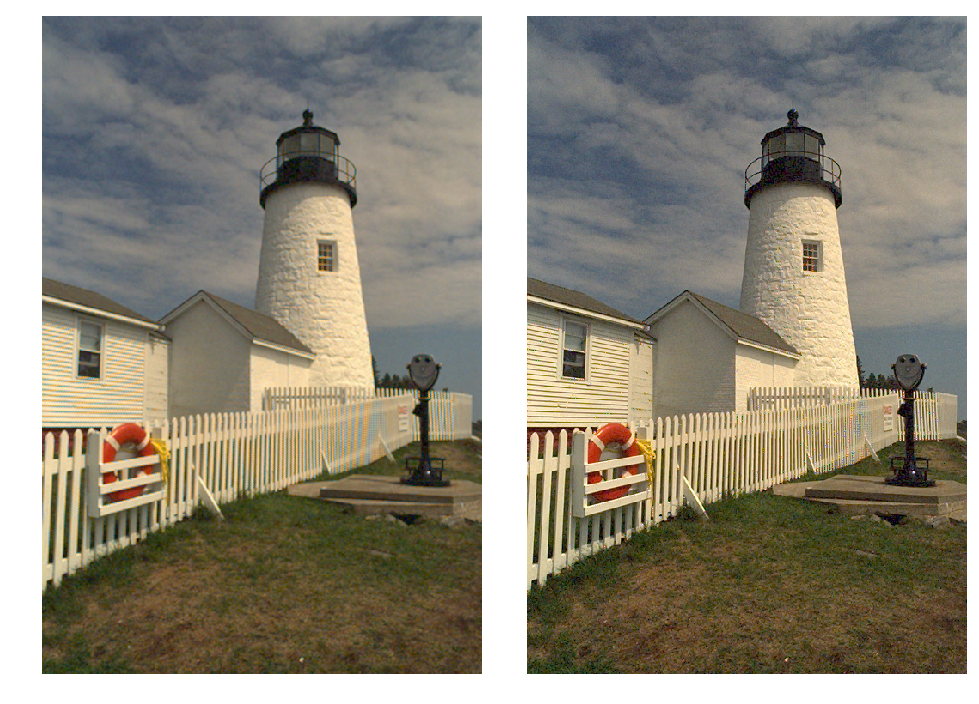

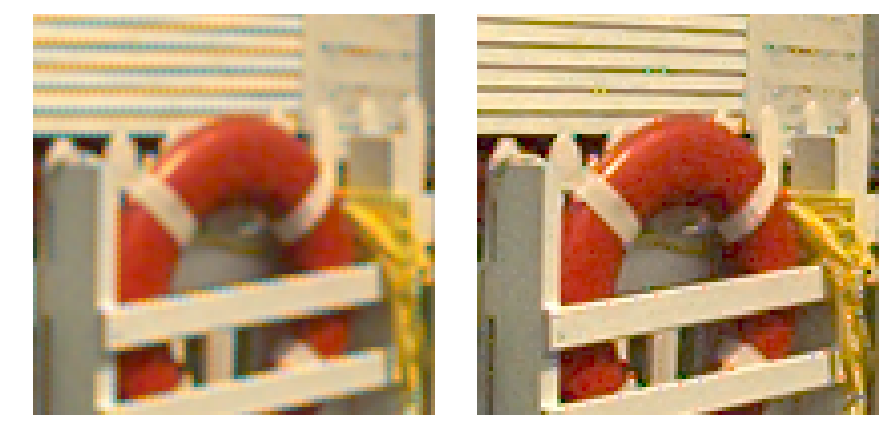

In [38]:
lh_basic = demosaic_basic(lh)
lh_gb = demosaic_green_based(lh)

show_image([lh_basic, lh_gb], zoom=0.5, needs_encoding=True)
show_image([lh_basic[450:550, 50:150],
            lh_gb[450:550, 50:150]], zoom=3.5, needs_encoding=True)

# imsave('lh_basic_demosaic.png', gamma_encode(lh_basic))

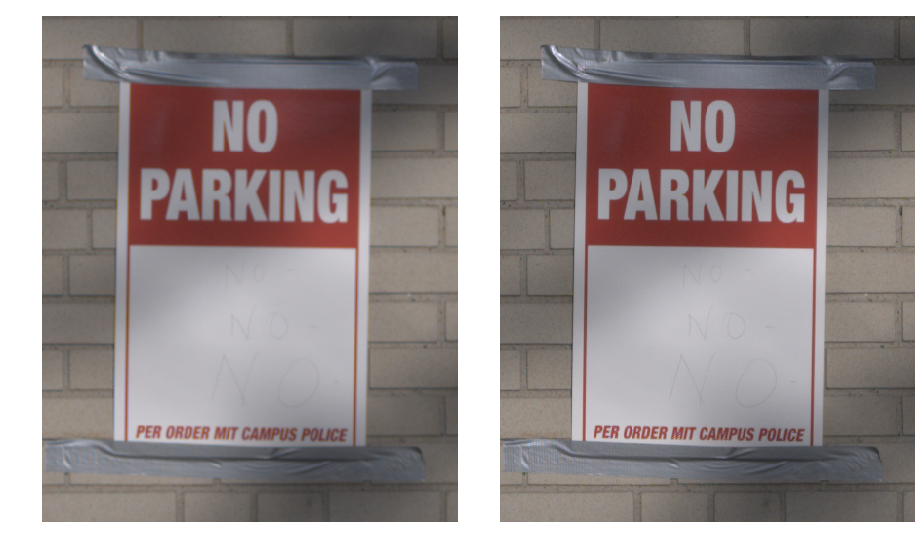

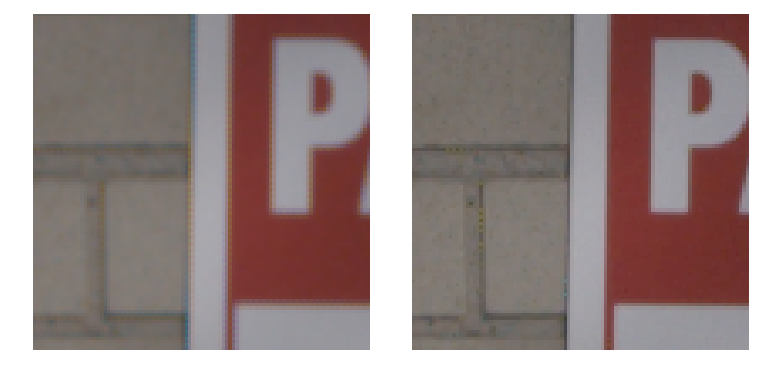

In [39]:
signs_small = ndimage.imread('task/data/raw/signs-small.png')/255
signs_small_basic = demosaic_basic(signs_small, offset=(1,1))
sigbs_small_gb    = demosaic_green_based(signs_small, offset=(1,1))
show_image([signs_small_basic,sigbs_small_gb], zoom=0.7, needs_encoding=True)
show_image([signs_small_basic[150:250,30:130],
            sigbs_small_gb[150:250,30:130]], zoom=3.0, needs_encoding=True)

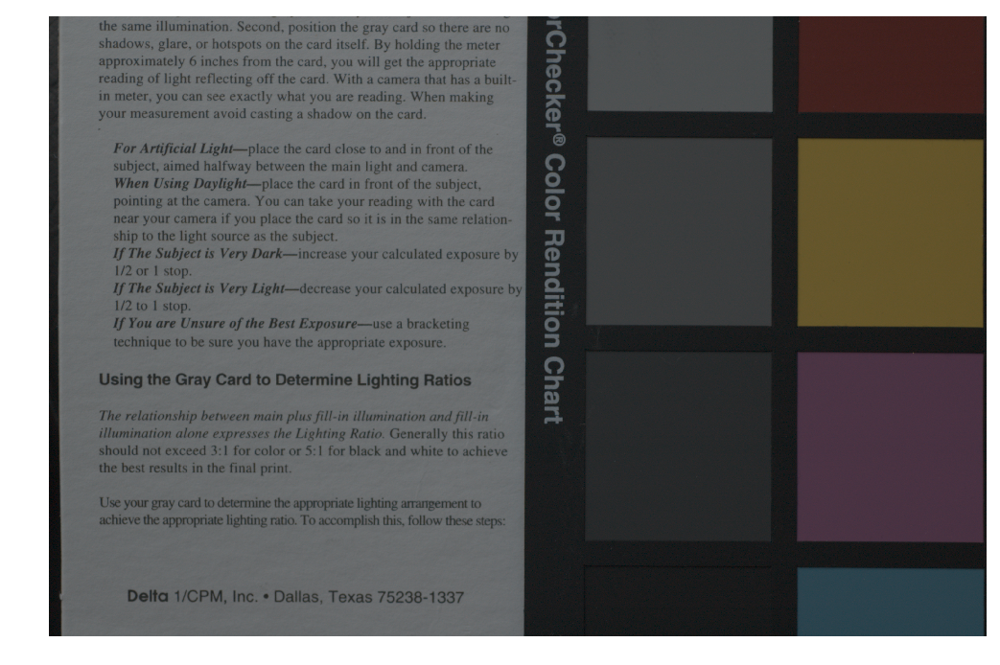

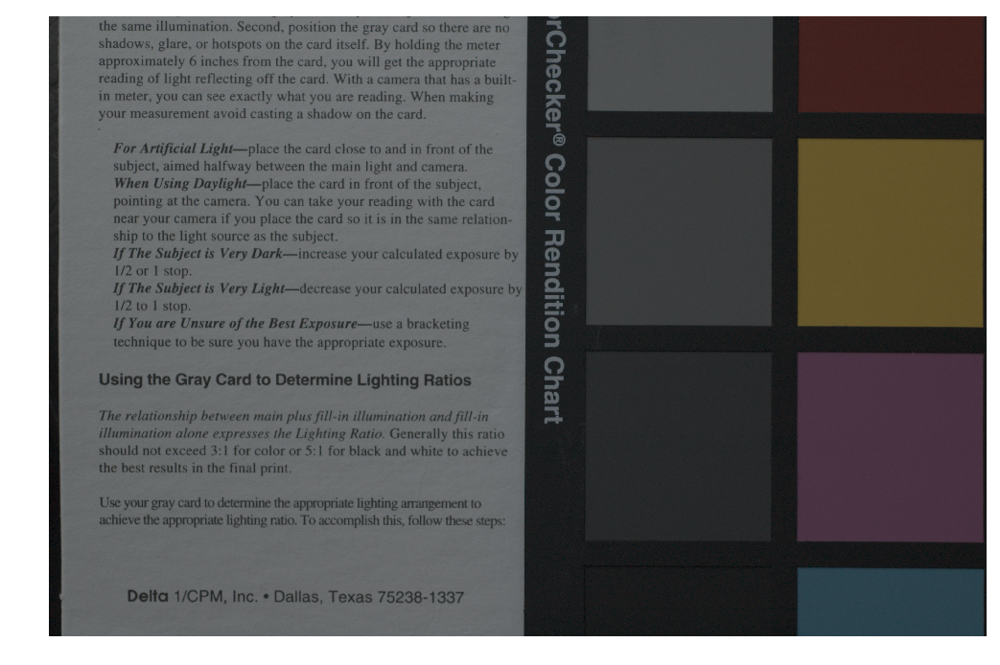

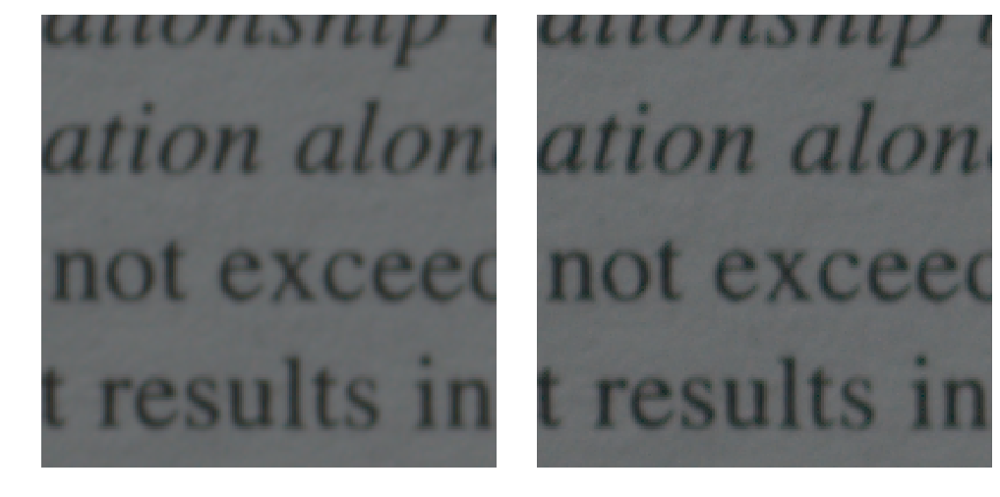

In [237]:
text = ndimage.imread('task/data/raw/text.png')/65535
text_basic = demosaic_basic(text, offset=(1,1))
text_basic = white_balance_gray(text_basic)
text_gb = demosaic_green_based(text, offset=(1,1))
text_gb = white_balance_gray(text_gb)
show_image(text_basic, zoom=0.4, needs_encoding=True)
show_image(text_gb, zoom=0.4, needs_encoding=True)
show_image([text_basic[1300:1500,300:500], text_gb[1300:1500,300:500]], zoom=2, needs_encoding=True)

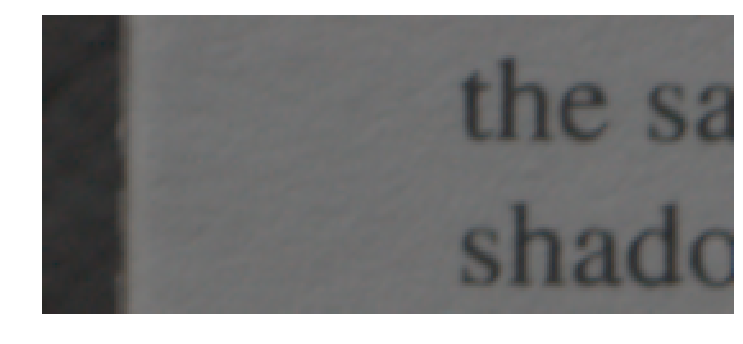

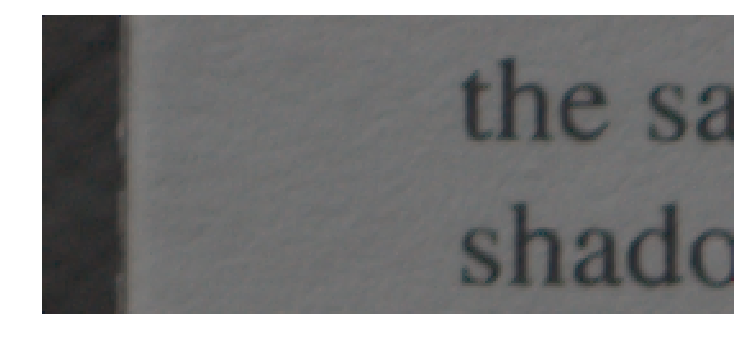

In [40]:
text = ndimage.imread('task/data/raw/text2.png')/65535
text_basic = demosaic_basic(text, mode='normal', offset=(1,1))
text_basic = white_balance_gray(text_basic)
text_gb = demosaic_green_based(text, offset=(1,1))
text_gb = white_balance_gray(text_gb)
show_image(text_basic, zoom=5, needs_encoding=True)
show_image(text_gb, zoom=5, needs_encoding=True)

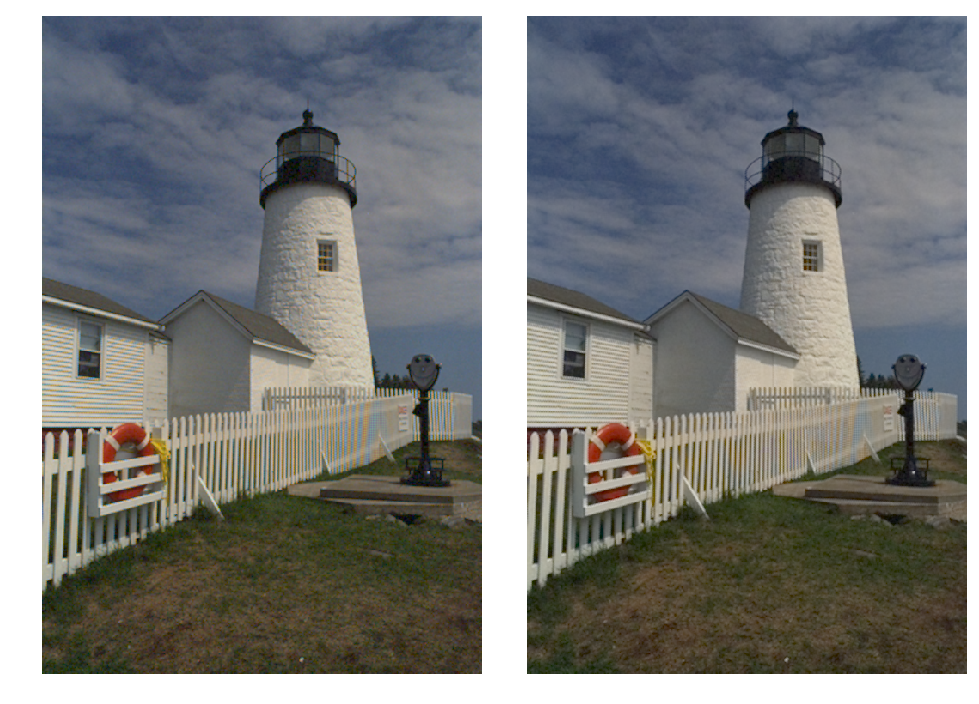

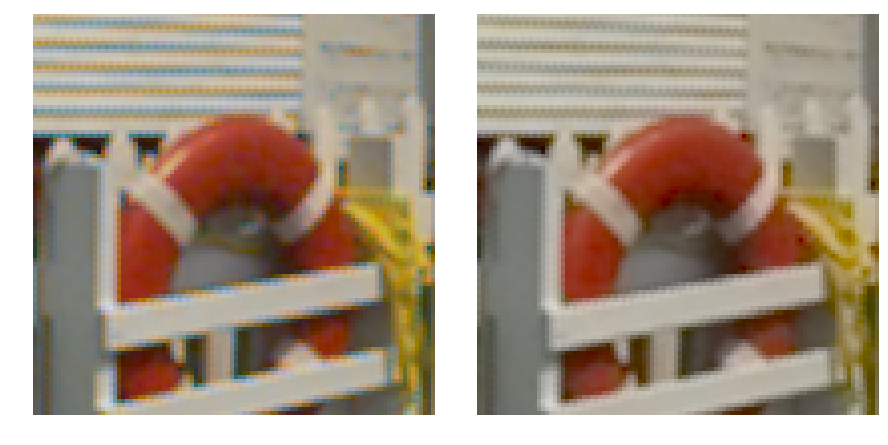

In [287]:
lh_eb = demosaic_basic(lh)
lh_eb = white_balance_gray(lh_eb)
lh_filtered = filter_median_chrominance(lh_eb)
show_image([lh_eb, lh_filtered], zoom=0.5, needs_encoding=True)
show_image([lh_eb[450:550, 50:150], lh_filtered[450:550, 50:150]], zoom=3.5, needs_encoding=True)

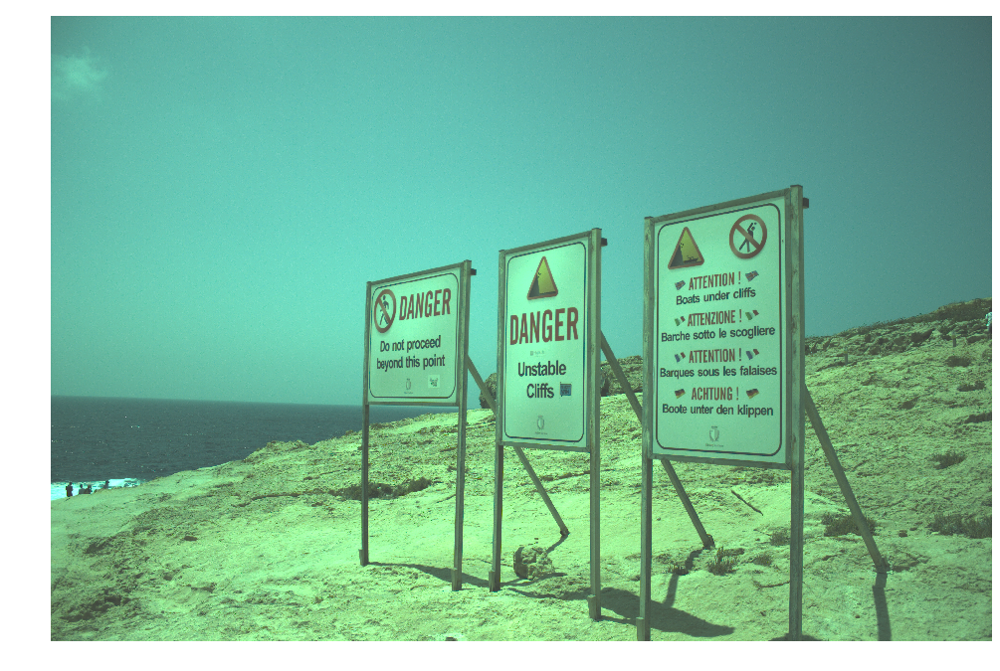

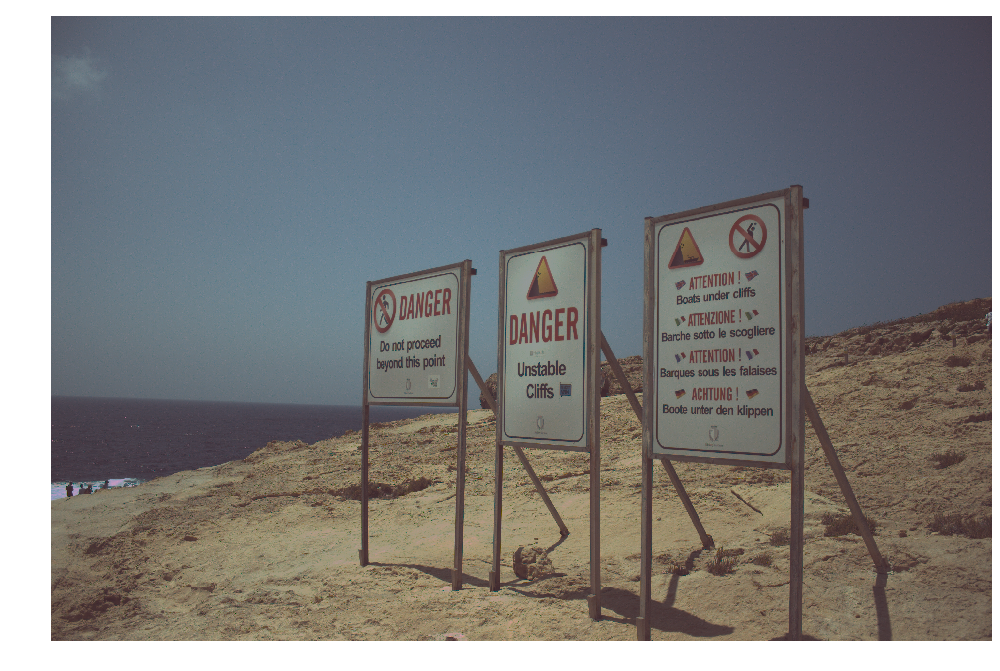

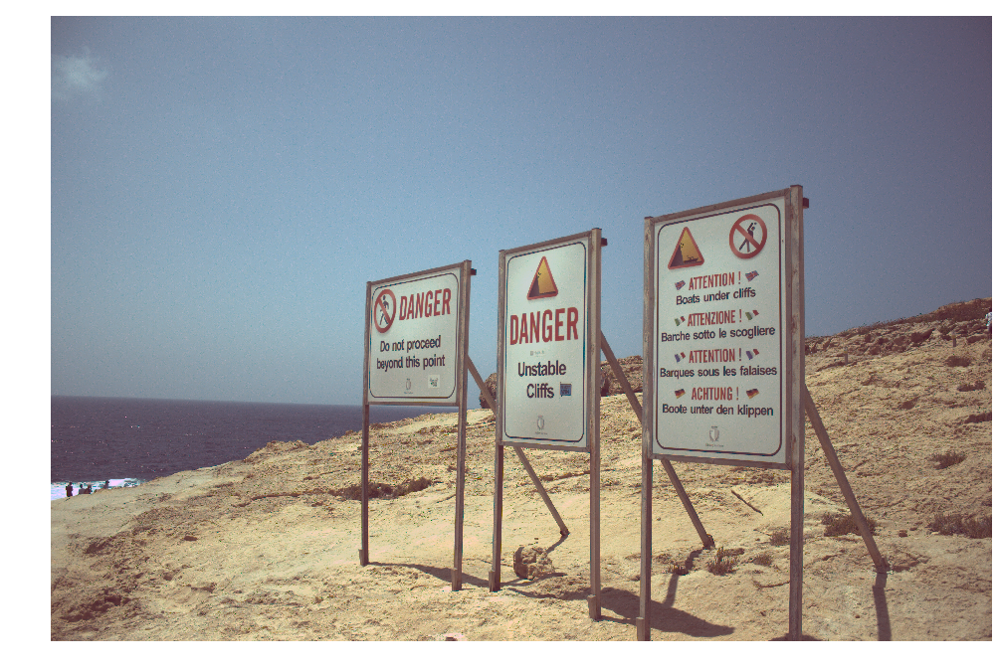

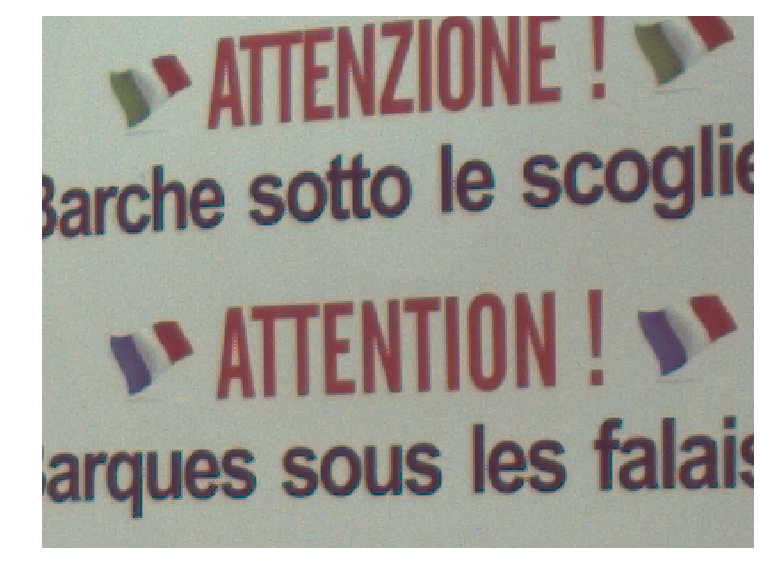

In [112]:
def rescale_percent(img, percent=1):
    img_l = img.reshape((-1,3)).mean(axis=1)
    img_l = np.amax(img.reshape((-1,3)),axis=1)
    img_l = np.sort(img_l)
    n = img_l.shape[0]
    low_p = 0 # int(n * (percent)/100)
    high_p = int(n * (100 - percent)/100)
    low = img_l[low_p]
    high = img_l[high_p]
    img = (img - low)/(high - low)*(1.0 - low) + low
    return np.maximum(np.minimum(1.0,img), 0.0)

# dcraw -D -o raw -g 1 1 -r 1 1 1 1 _MG_4257.CR2
cliffs = ndimage.imread('task/data/raw/_MG_4257.pgm')/255
cliffs = gamma_decode(cliffs)
cliffs_gb = demosaic_green_based(cliffs, offset=(0,0))
show_image(cliffs_gb, zoom=0.3, needs_encoding=True)
cliffs_gb_wb = white_balance_gray(cliffs_gb)
show_image(cliffs_gb_wb, zoom=0.3, needs_encoding=True)
cliffs_gb_wb = rescale_percent(cliffs_gb_wb, 0.1)
show_image(cliffs_gb_wb, zoom=0.3, needs_encoding=True)
show_image(cliffs_gb_wb[1230:1530,2550:2950], zoom=2.0, needs_encoding=True)